<a href="https://colab.research.google.com/github/ArmandoSaboia/banking_marketing/blob/main/notebook/Bank_term_deposit_marketing_problem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pycaret[full] shap pycaret[analysis] lazypredict catboost autoviz -U ydata-profiling dataprep sweetviz lux gradio --upgrade IPython -q streamlit pyngrok PyYAML

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 483.6/483.6 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 31.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 28.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 100.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 61.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.9/19.9 MB 43.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.7/797.7 kB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 39.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.2/681.2 kB 38.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import ydata_profiling
from ydata_profiling import ProfileReport
import sys
!{sys.executable} -m pip install -U ydata-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension
from dataprep.eda import create_report
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
from IPython.display import display, HTML, IFrame
import lux
import sweetviz as sv
import shap
shap.initjs()
import gradio as gr
import streamlit as st
import lazypredict
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from pycaret.classification import *
from pycaret.classification import compare_models, create_model, tune_model
from lazypredict.Supervised import LazyClassifier
from catboost import CatBoostClassifier
from sklearn.preprocessing import LabelEncoder
import os
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore", category=ConvergenceWarning)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


Imported v0.1.604. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [ ]:
# Data Loading
df = pd.read_csv('/content/bank-full.csv', sep=";")

In [ ]:
# Exploratory Data Analysis (EDA)
def bank_df(df):
    print("##################### Shape #####################")
    print(df.shape)
    print("##################### Types #####################")
    print(df.dtypes)
    print("##################### Head #####################")
    print(df.head(5))
    print("##################### Info #####################")
    print(df.info())
    print("##################### NA #####################")
    print(df.isnull().sum())
    print("##################### Describe #####################")
    print(df.describe())
    print("##################### Quantiles #####################")
    print(df.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)
    print("##################### Correlation #####################")
    print(df.corr())

bank_df(df)

##################### Shape #####################
(45211, 17)
##################### Types #####################
age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object
##################### Head #####################
   age           job  marital  education default  balance housing loan  \
0   58    management  married   tertiary      no     2143     yes   no   
1   44    technician   single  secondary      no       29     yes   no   
2   33  entrepreneur  married  secondary      no        2     yes  yes   
3   47   blue-collar  married    unknown      no     1506     yes   no   
4   33       unknown   single    unknown      no        1      no   no   

   contact  day month  duration  campaig

In [ ]:
# Rename the column 'y' to 'term_deposit'
df.rename(columns={'y': 'term_deposit'}, inplace=True)

In [ ]:
df.describe().T.style.bar(
    subset=["mean"], color="#205ff2"
).background_gradient(
    subset=["std"], cmap="Reds"
).background_gradient(
    subset=["50%"], cmap="coolwarm"
)

,count,mean,std,min,25%,50%,75%,max
age,45211.000000,40.936210,10.618762,18.000000,33.000000,39.000000,48.000000,95.000000
balance,45211.000000,1362.272058,3044.765829,-8019.000000,72.000000,448.000000,1428.000000,102127.000000
day,45211.000000,15.806419,8.322476,1.000000,8.000000,16.000000,21.000000,31.000000
duration,45211.000000,258.163080,257.527812,0.000000,103.000000,180.000000,319.000000,4918.000000
campaign,45211.000000,2.763841,3.098021,1.000000,1.000000,2.000000,3.000000,63.000000
pdays,45211.000000,40.197828,100.128746,-1.000000,-1.000000,-1.000000,-1.000000,871.000000
previous,45211.000000,0.580323,2.303441,0.000000,0.000000,0.000000,0.000000,275.000000


In [ ]:
# Numerical and categorical Variables
def col_names(df, cat_th=10, car_th=20):
    categorical_cols = [col for col in df.columns if df[col].dtypes == "O"]
    numerical_but_categorical = [col for col in df.columns if df[col].nunique() < cat_th and
                   df[col].dtypes != "O"]
    categorical_but_cardinal = [col for col in df.columns if df[col].nunique() > car_th and
                   df[col].dtypes == "O"]
    categorical_cols = categorical_cols + numerical_but_categorical
    categorical_cols = [col for col in categorical_cols if col not in categorical_but_cardinal]

    # num_cols
    numerical_cols = [col for col in df.columns if df[col].dtypes != "O"]
    numerical_cols = [col for col in numerical_cols if col not in numerical_but_categorical]

    print(f"observations: {df.shape[0]}")
    print(f"variables: {df.shape[1]}")
    print(f'categorical_cols: {len(categorical_cols)}')
    print(f'numerical_cols: {len(numerical_cols)}')
    print(f'categorical_but_cardinal: {len(categorical_but_cardinal)}')
    print(f'numerical_but_categorical: {len(numerical_but_categorical)}')
    return categorical_cols, numerical_cols, categorical_but_cardinal

categorical_cols, numerical_cols, categorical_but_cardinal = col_names(df)

observations: 45211
variables: 17
categorical_cols: 10
numerical_cols: 7
categorical_but_cardinal: 0
numerical_but_categorical: 0


In [ ]:
categorical_cols

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome',
 'term_deposit']

In [ ]:
numerical_cols

['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

                job  Ratio
blue-collar    9732 21.526
management     9458 20.920
technician     7597 16.803
admin.         5171 11.437
services       4154  9.188
retired        2264  5.008
self-employed  1579  3.493
entrepreneur   1487  3.289
unemployed     1303  2.882
housemaid      1240  2.743
student         938  2.075
unknown         288  0.637


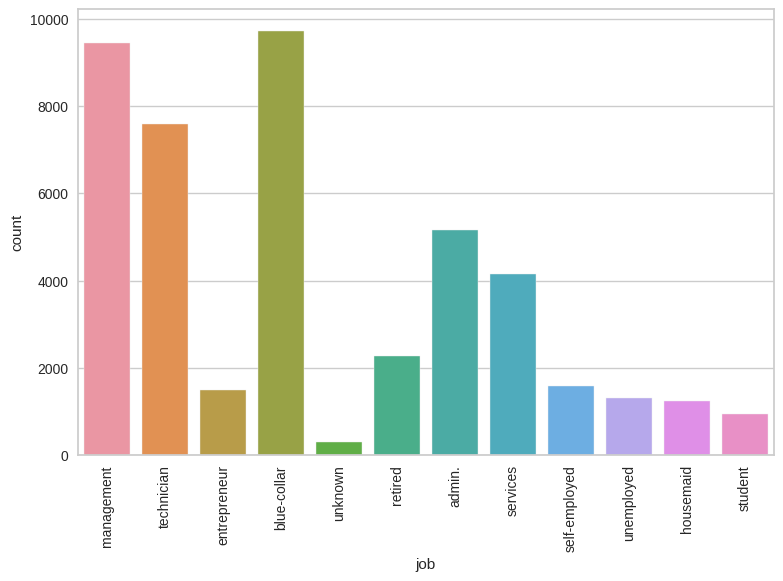

          marital  Ratio
married     27214 60.193
single      12790 28.290
divorced     5207 11.517


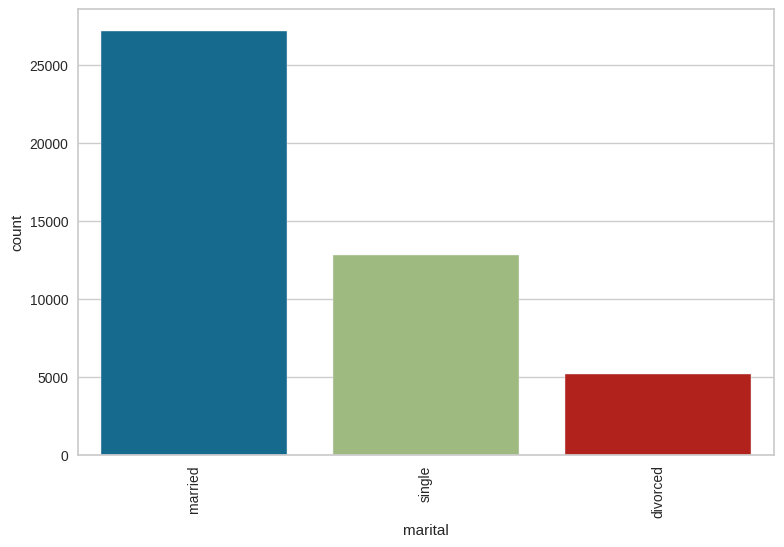

           education  Ratio
secondary      23202 51.319
tertiary       13301 29.420
primary         6851 15.153
unknown         1857  4.107


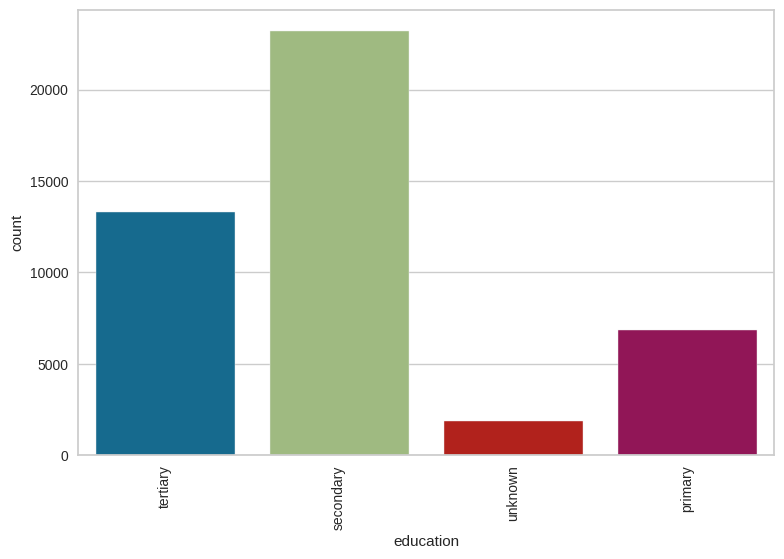

     default  Ratio
no     44396 98.197
yes      815  1.803


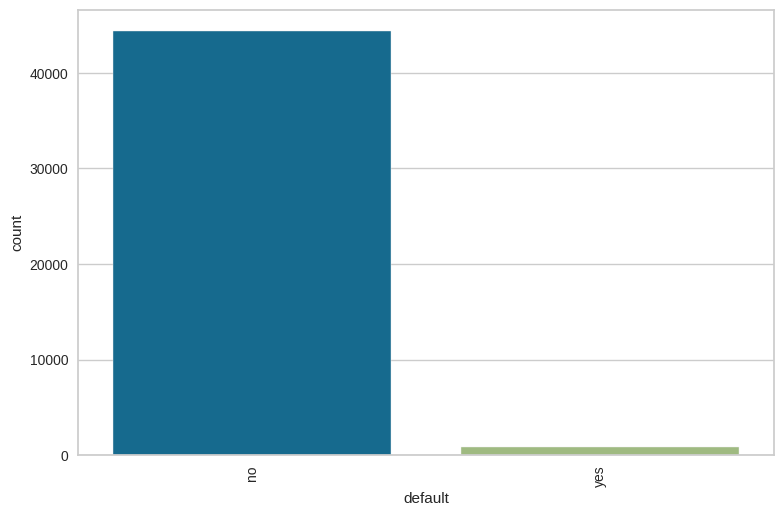

     housing  Ratio
yes    25130 55.584
no     20081 44.416


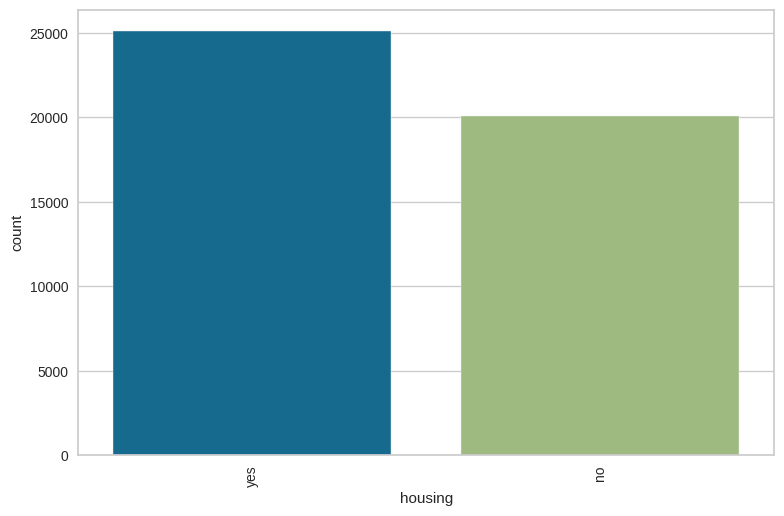

      loan  Ratio
no   37967 83.977
yes   7244 16.023


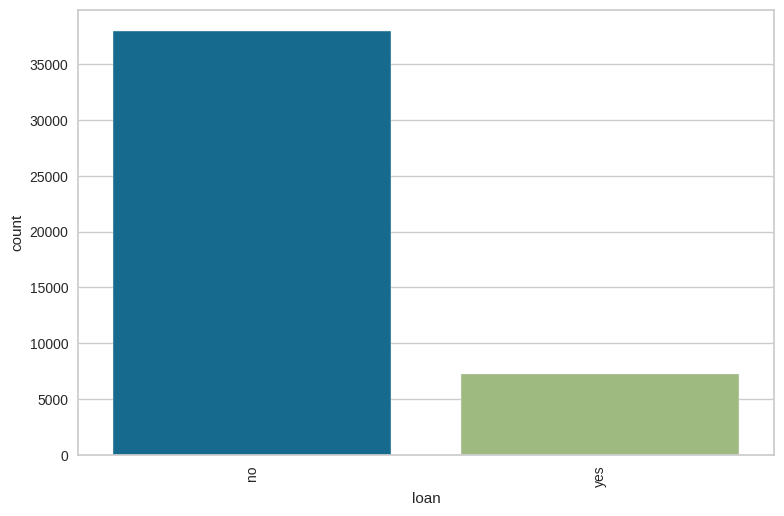

           contact  Ratio
cellular     29285 64.774
unknown      13020 28.798
telephone     2906  6.428


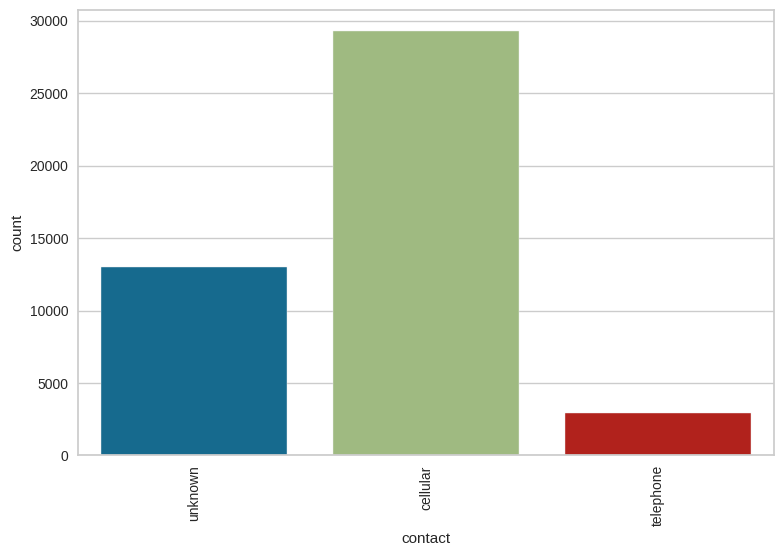

     month  Ratio
may  13766 30.448
jul   6895 15.251
aug   6247 13.817
jun   5341 11.813
nov   3970  8.781
apr   2932  6.485
feb   2649  5.859
jan   1403  3.103
oct    738  1.632
sep    579  1.281
mar    477  1.055
dec    214  0.473


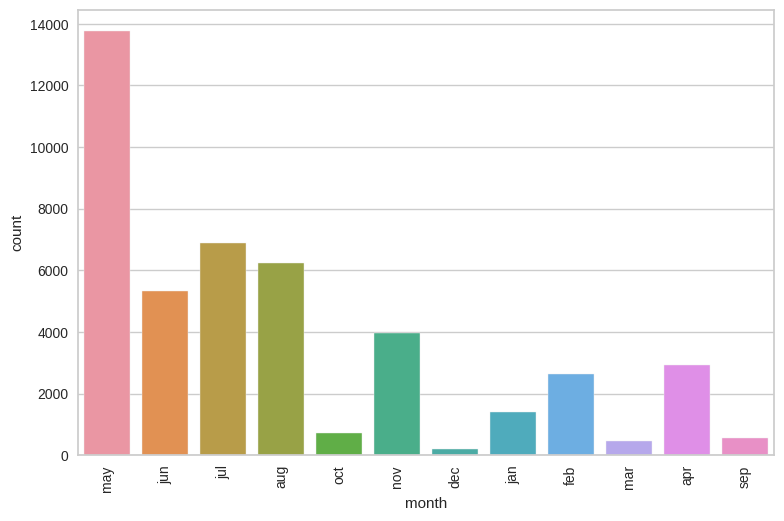

         poutcome  Ratio
unknown     36959 81.748
failure      4901 10.840
other        1840  4.070
success      1511  3.342


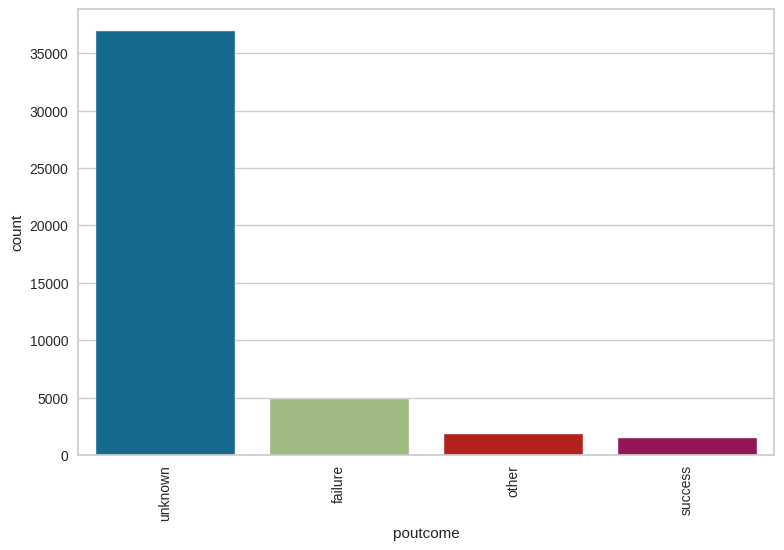

     term_deposit  Ratio
no          39922 88.302
yes          5289 11.698


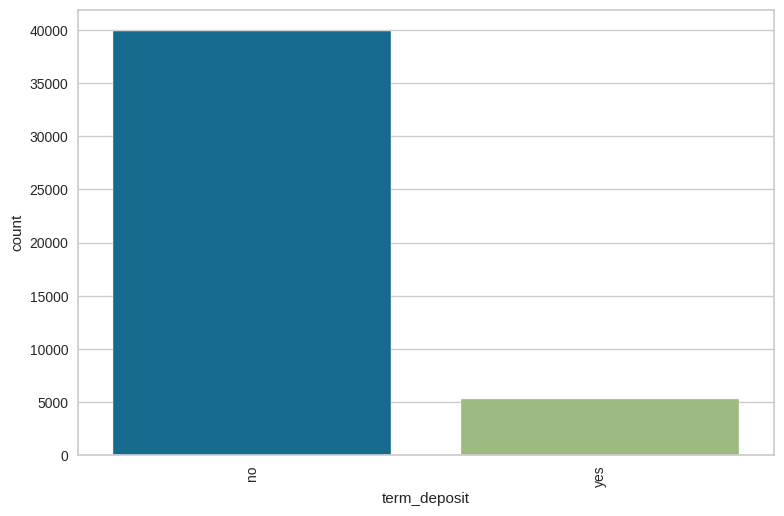

In [ ]:
# Categorical analysis
def categorical_analysis(df, col_name, plot=False):
     print(pd.DataFrame({col_name: df[col_name].value_counts(),
                         "Ratio": 100 * df[col_name].value_counts() / len(df)}))
     if plot:
         sns.countplot(x=df[col_name], data=df)
         plt.xticks(rotation=90)
         plt.show(block=True)

for col in categorical_cols:
    categorical_analysis(df, col, True)

count   45211.000
mean       40.936
std        10.619
min        18.000
5%         27.000
10%        29.000
20%        32.000
30%        34.000
40%        36.000
50%        39.000
60%        42.000
70%        46.000
90%        56.000
95%        59.000
99%        71.000
max        95.000
Name: age, dtype: float64


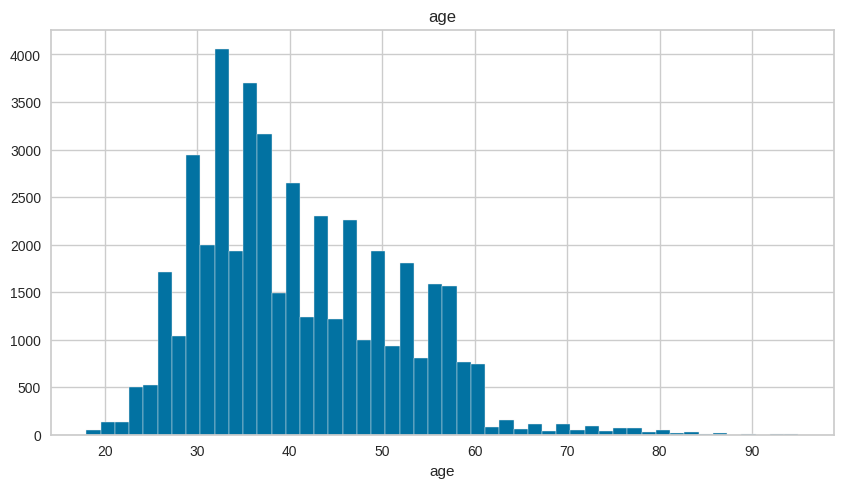

count    45211.000
mean      1362.272
std       3044.766
min      -8019.000
5%        -172.000
10%          0.000
20%         22.000
30%        131.000
40%        272.000
50%        448.000
60%        701.000
70%       1126.000
90%       3574.000
95%       5768.000
99%      13164.900
max     102127.000
Name: balance, dtype: float64


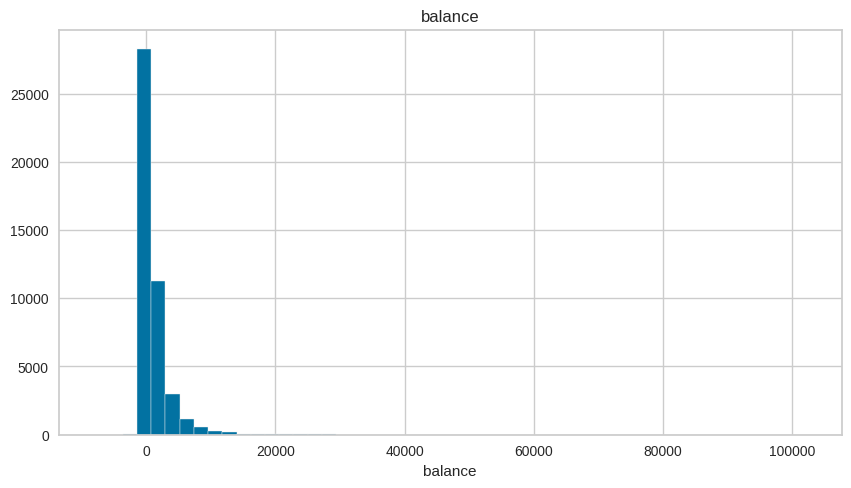

count   45211.000
mean       15.806
std         8.322
min         1.000
5%          3.000
10%         5.000
20%         7.000
30%        10.000
40%        13.000
50%        16.000
60%        18.000
70%        20.000
90%        28.000
95%        29.000
99%        31.000
max        31.000
Name: day, dtype: float64


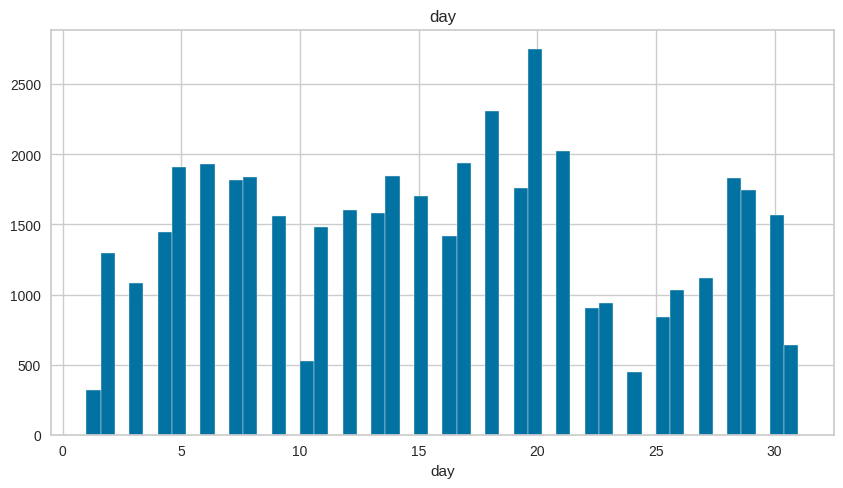

count   45211.000
mean      258.163
std       257.528
min         0.000
5%         35.000
10%        58.000
20%        89.000
30%       117.000
40%       147.000
50%       180.000
60%       223.000
70%       280.000
90%       548.000
95%       751.000
99%      1269.000
max      4918.000
Name: duration, dtype: float64


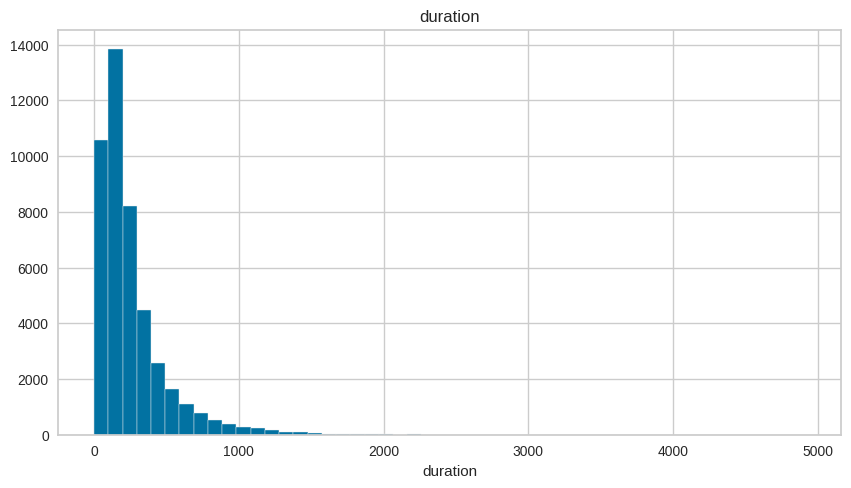

count   45211.000
mean        2.764
std         3.098
min         1.000
5%          1.000
10%         1.000
20%         1.000
30%         1.000
40%         2.000
50%         2.000
60%         2.000
70%         3.000
90%         5.000
95%         8.000
99%        16.000
max        63.000
Name: campaign, dtype: float64


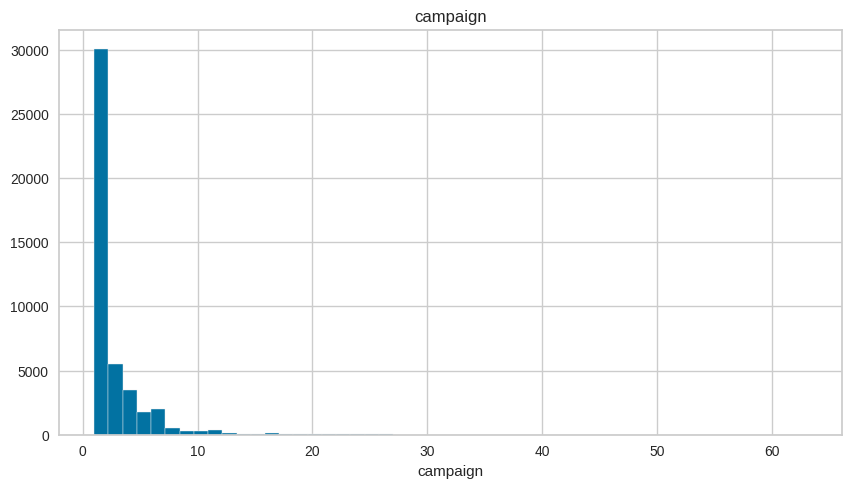

count   45211.000
mean       40.198
std       100.129
min        -1.000
5%         -1.000
10%        -1.000
20%        -1.000
30%        -1.000
40%        -1.000
50%        -1.000
60%        -1.000
70%        -1.000
90%       185.000
95%       317.000
99%       370.000
max       871.000
Name: pdays, dtype: float64


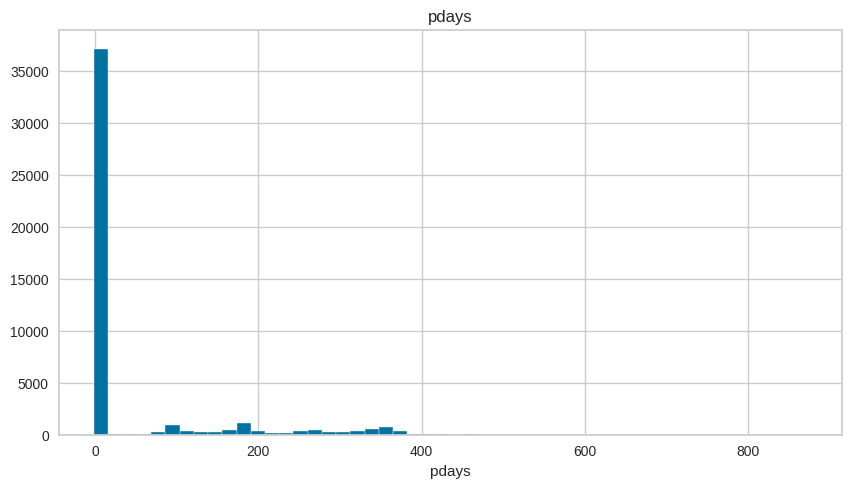

count   45211.000
mean        0.580
std         2.303
min         0.000
5%          0.000
10%         0.000
20%         0.000
30%         0.000
40%         0.000
50%         0.000
60%         0.000
70%         0.000
90%         2.000
95%         3.000
99%         8.900
max       275.000
Name: previous, dtype: float64


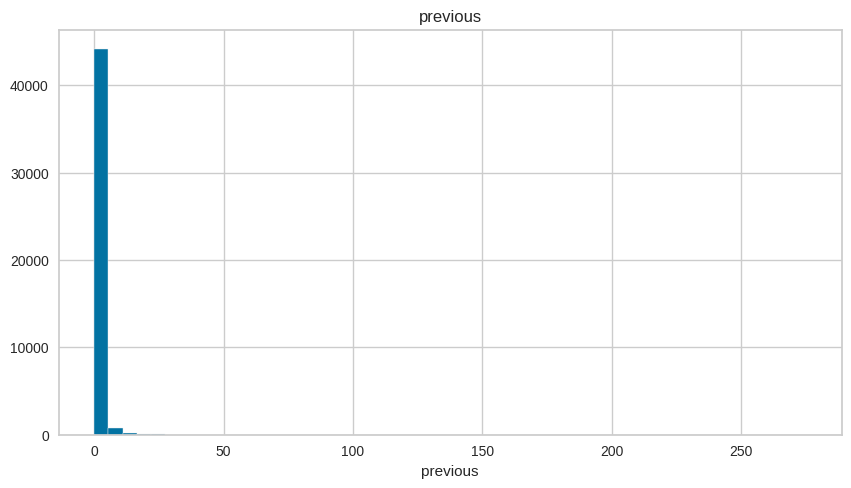

In [ ]:
# Numerical analysis
def numerical_analysis(df, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.90, 0.95, 0.99]
    print(df[numerical_col].describe(quantiles).T)

    if plot:
        df[numerical_col].hist(bins=50, figsize=(9,5))
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show()

for col in numerical_cols:
    numerical_analysis(df, col, True)

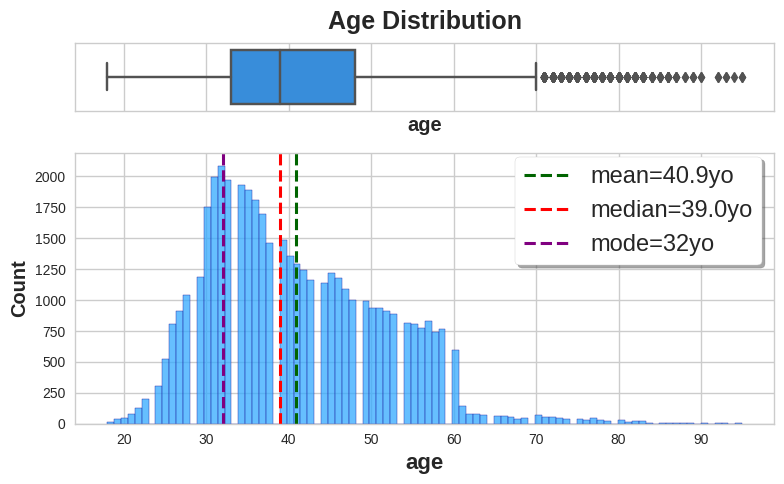

In [ ]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc("axes", labelweight="bold", labelsize="large", titleweight="bold", titlesize=14, titlepad=10)


def numerical_plot(df, col, title, symb):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(8,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sns.boxplot(x=col, data=df, ax=ax[0],color = "#1D8EF5")
    ax[0].set(yticks=[])
    sns.histplot(x=col, data=df, ax=ax[1],color = "#33AAFF", edgecolor="#1D1EA2")
    ax[1].set_xlabel(col, fontsize=16)
    plt.axvline(df[col].mean(), color='darkgreen', linestyle='--',linewidth=2.2, label='mean=' + str(np.round(df[col].mean(),1)) + symb)
    plt.axvline(df[col].median(), color='red', linestyle='--',linewidth=2.2, label='median='+ str(np.round(df[col].median(),1)) + symb)
    plt.axvline(df[col].mode()[0], color='purple', linestyle='--',linewidth=2.2, label='mode='+ str(np.round(df[col].mode()[0],1)) + symb)
    plt.legend(bbox_to_anchor=(1, 1.03), ncol=1, fontsize=17, fancybox=True, shadow=True, frameon=True)
    plt.tight_layout()
    plt.show()

numerical_plot(df, 'age', 'Age Distribution', 'yo')

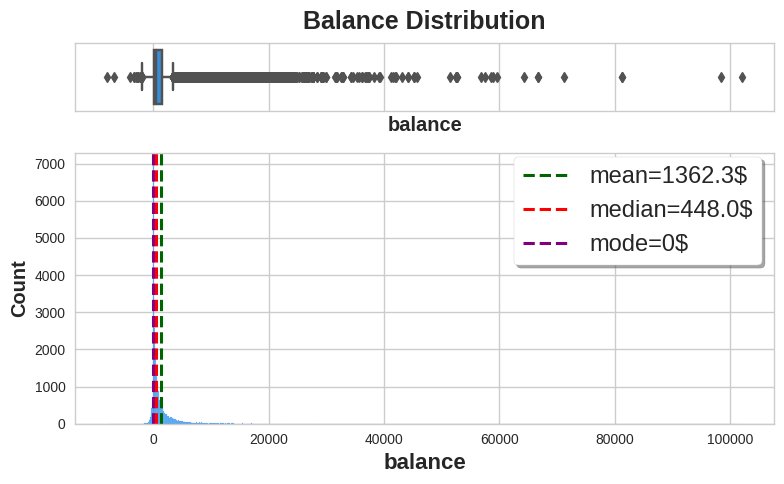

In [ ]:
numerical_plot(df, 'balance', 'Balance Distribution', '$')

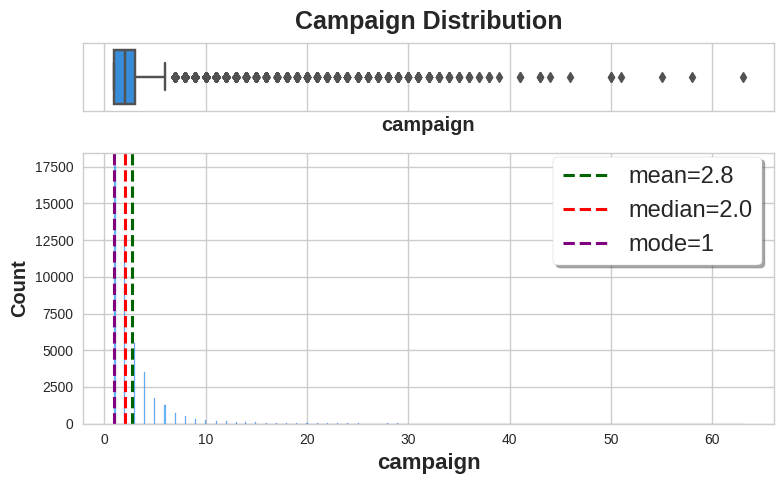

In [ ]:
numerical_plot(df, 'campaign', 'Campaign Distribution', '')

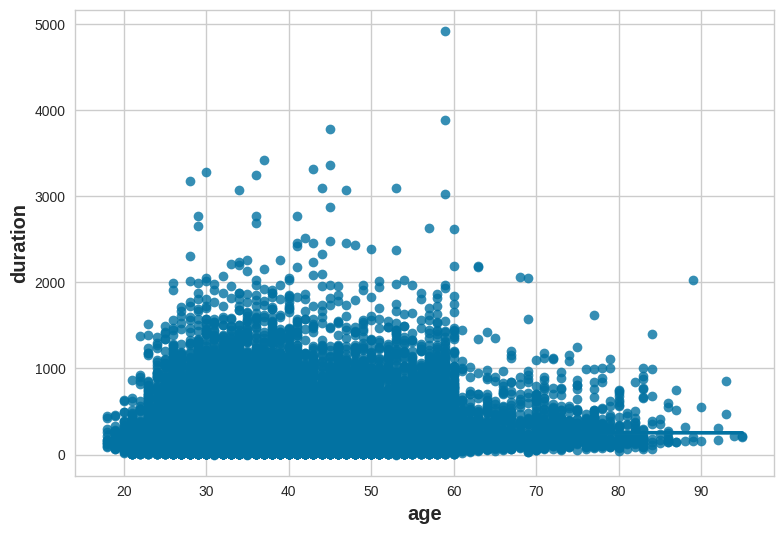

In [ ]:
sns.regplot(x='age',y='duration', data=df)
plt.show()

In [ ]:
df["age_cut"] = pd.cut(df['age'], bins=[0, 35, 55, 70, float('Inf')], labels=['0-35', '35-55', '55-70', '70-100'])

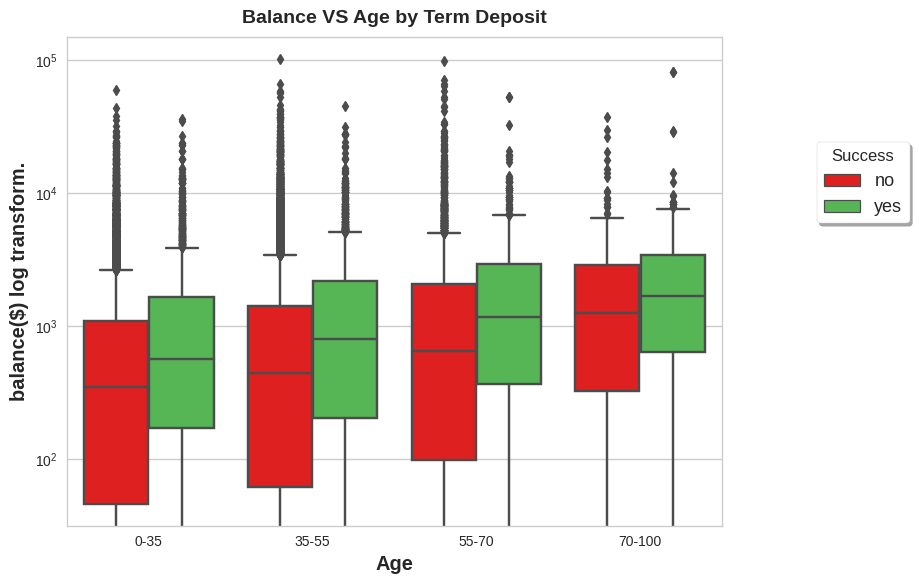

In [ ]:
palette = {'yes':'green', 'no':'red'}
palette = {'yes':'#46C646', 'no':'#FF0000'}

plt.figure(figsize=(10,6))
sns.boxplot(x='age_cut', y='balance', hue='term_deposit', data=df, palette=palette)
plt.ylabel('balance($) log transform.')
plt.xlabel('Age')
plt.title('Balance VS Age by Term Deposit')
plt.yscale('log')
plt.legend(bbox_to_anchor=(1.3, 0.6), title='Success', loc = 'lower right', fontsize=13, fancybox=True, shadow=True, frameon=True)
plt.show()

In [ ]:
df = df.drop('age_cut', axis=1)

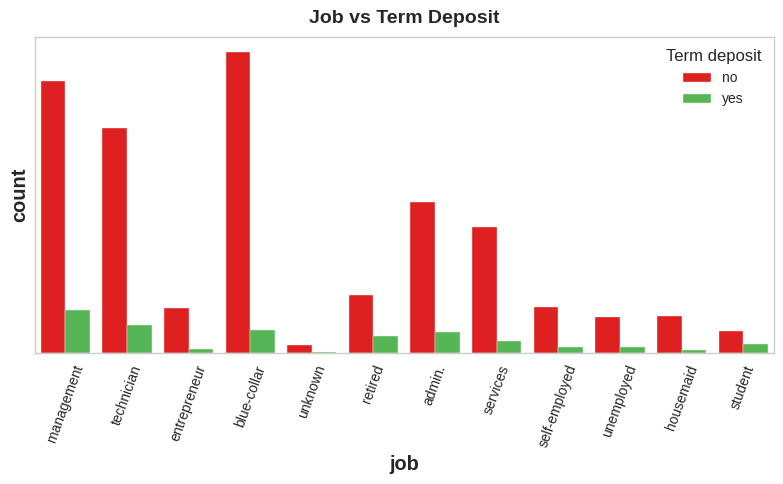

In [ ]:
plt.figure(figsize=(8, 5));
plt.title('Job vs Term Deposit')
g = sns.countplot(x= 'job', hue = 'term_deposit', data=df, palette=palette)
plt.xticks(rotation=70)
plt.yticks([])
plt.legend(title='Term deposit', ncol=1, fancybox=True, shadow=True)
plt.show()

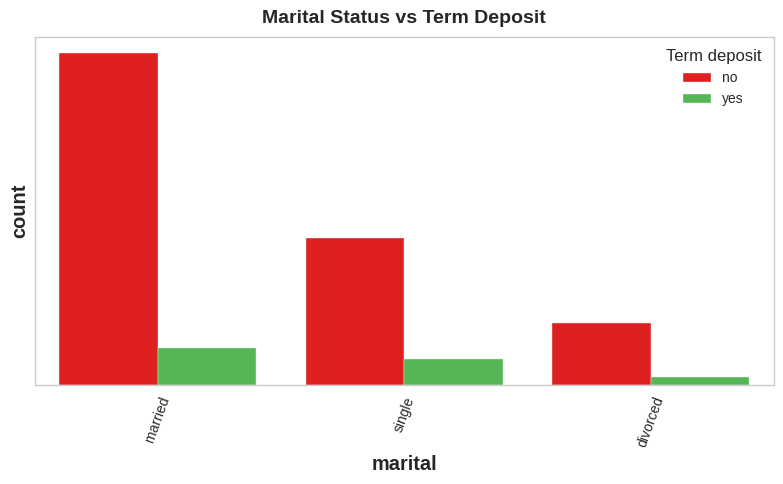

In [ ]:
plt.figure(figsize=(8, 5));
plt.title('Marital Status vs Term Deposit')
g = sns.countplot(x= 'marital', hue = 'term_deposit', data=df, palette=palette);
plt.xticks(rotation=70)
plt.yticks([])
plt.legend(title='Term deposit', ncol=1, fancybox=True, shadow=True)
plt.show()

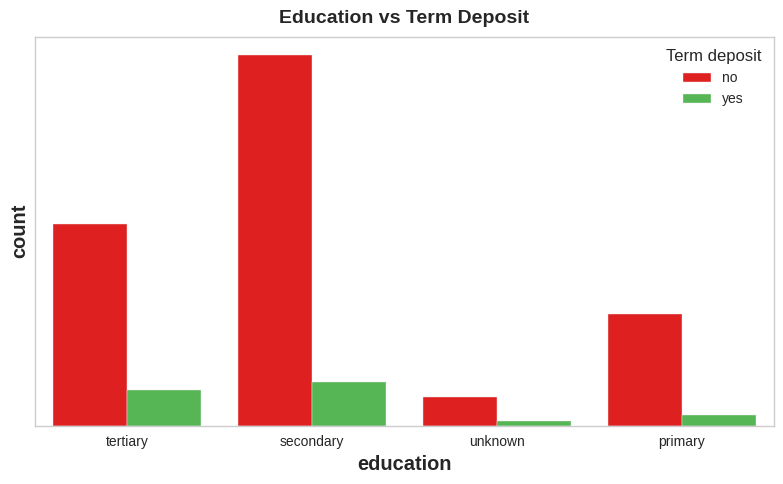

In [ ]:
plt.figure(figsize=(8, 5));
plt.title('Education vs Term Deposit')
g = sns.countplot(x= 'education', hue = 'term_deposit', data=df, palette=palette);
plt.legend(title='Term deposit', ncol=1, fancybox=True, shadow=True)
plt.yticks([])
plt.show()

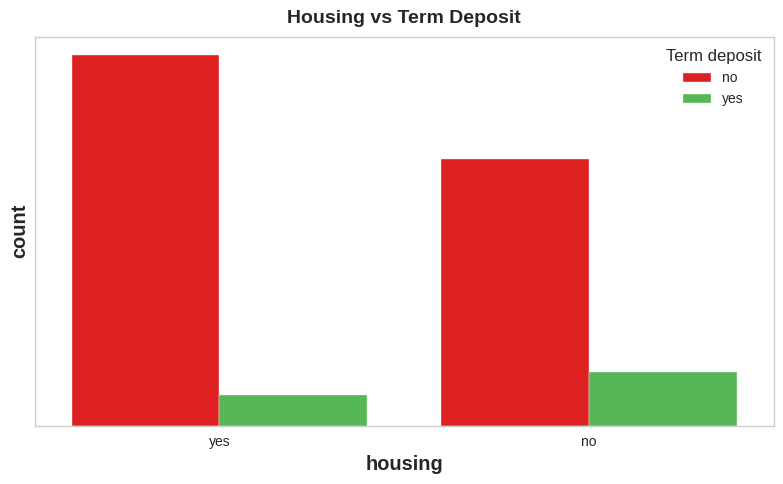

In [ ]:
plt.figure(figsize=(8, 5));
plt.title('Housing vs Term Deposit')
g = sns.countplot(x= 'housing', hue = 'term_deposit', data=df, palette=palette);
plt.legend(title='Term deposit', ncol=1, fancybox=True, shadow=True)
plt.yticks([])
plt.show()

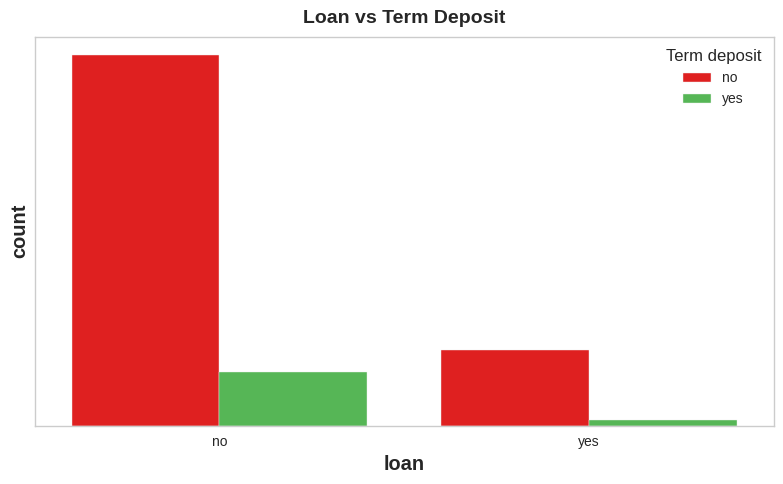

In [ ]:
plt.figure(figsize=(8, 5));
plt.title('Loan vs Term Deposit')
g = sns.countplot(x= 'loan', hue = 'term_deposit', data=df, palette=palette);
plt.legend(title='Term deposit', ncol=1, fancybox=True, shadow=True)
plt.yticks([])
plt.show()

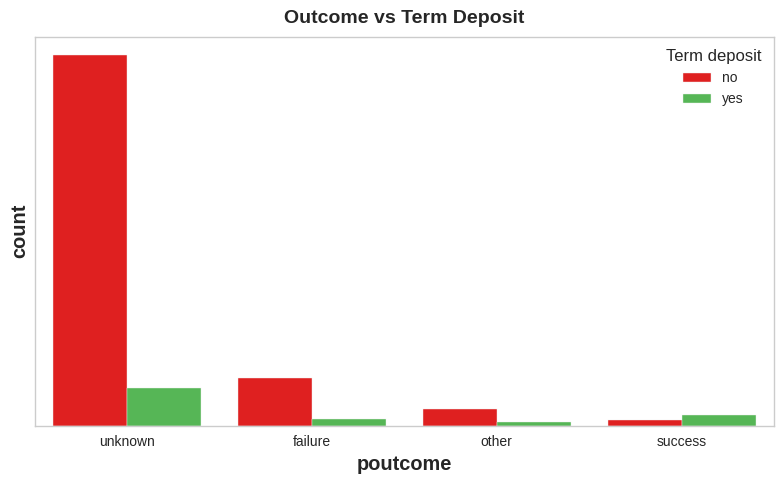

In [ ]:
plt.figure(figsize=(8, 5));
plt.title('Outcome vs Term Deposit')
g = sns.countplot(x= 'poutcome', hue = 'term_deposit', data=df, palette=palette);
plt.legend(title='Term deposit', ncol=1, fancybox=True, shadow=True)
plt.yticks([])
plt.show()

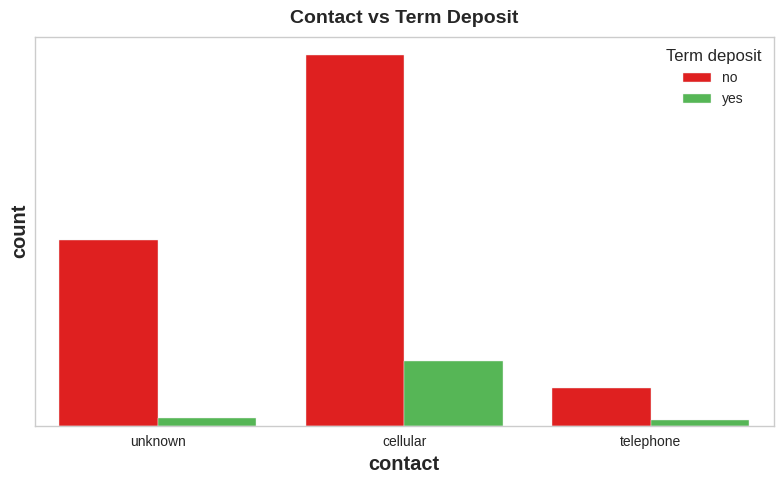

In [ ]:
plt.figure(figsize=(8, 5));
plt.title('Contact vs Term Deposit')
g = sns.countplot(x= 'contact', hue = 'term_deposit', data=df, palette=palette);
plt.legend(title='Term deposit', ncol=1, fancybox=True, shadow=True)
plt.yticks([])
plt.show()

In [50]:
corr = df[numerical_cols].corr()
corr

Button(description='Toggle Pandas/Lux', layout=Layout(top='5px', width='140px'), style=ButtonStyle())

Output()

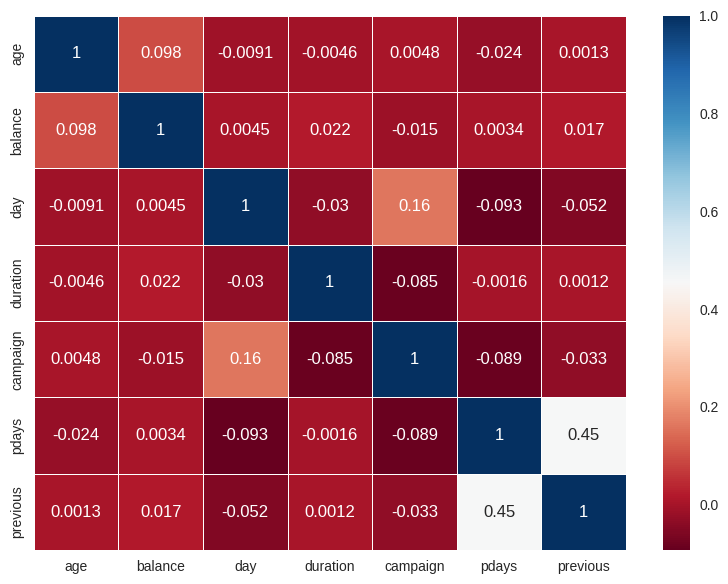

In [ ]:
def correlation_matrix(df, cols):
     fig = plt.gcf()
     fig.set_size_inches(8, 6)
     plt.xticks(fontsize=10)
     plt.yticks(fontsize=10)
     fig = sns.heatmap(df[cols].corr(), annot=True, linewidths=0.5, annot_kws={'size': 12}, linecolor='w', cmap='RdBu')
     plt.show(block=True)

correlation_matrix(df, numerical_cols)

In [ ]:
# AutoViz
exp_name = setup(data = df,  target = 'term_deposit')
eda(display_format = 'bokeh')

,Description,Value
0,Session id,1974
1,Target,term_deposit
2,Target type,Binary
3,Target mapping,"no: 0, yes: 1"
4,Original data shape,"(45211, 17)"
5,Transformed data shape,"(45211, 49)"
6,Transformed train set shape,"(31647, 49)"
7,Transformed test set shape,"(13564, 49)"
8,Ordinal features,3
9,Numeric features,7


Shape of your Data Set loaded: (45211, 49)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
age,0.000000,0.170313,float64,77,0,0,
job_technician,0.000000,0.004424,float64,2,0,0,right skewed distribution: cap or drop outliers
contact_telephone,0.000000,0.004424,float64,2,0,0,right skewed distribution: cap or drop outliers
day,0.000000,0.068567,float64,31,0,0,
month_may,0.000000,0.004424,float64,2,0,0,
month_aug,0.000000,0.004424,float64,2,0,0,right skewed distribution: cap or drop outliers
month_jun,0.000000,0.004424,float64,2,0,0,right skewed distribution: cap or drop outliers
month_jul,0.000000,0.004424,float64,2,0,0,right skewed distribution: cap or drop outliers
month_sep,0.000000,0.004424,float64,2,0,0,highly right skewed distribution: drop outliers or do box-cox transform
month_nov,0.000000,0.004424,float64,2,0,0,right skewed distribution: cap or drop outliers


    48 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
Number of variables = 48 exceeds limit, finding top 30 variables through XGBoost
    No categorical feature reduction done. All 41 Categorical vars selected 
    Removing correlated variables from 7 numerics using SULO method
Selecting all (7) variables since none of them are highly correlated...
    Adding 41 categorical variables to reduced numeric variables  of 7
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 48 
    Finding Important Features using Boosted Trees algorithm...
        using 48 variables...
        using 38 variables...
        using 28 variables...
        using 18 variables...
        using 8 variables...
Found 15 important features
#######################################################################################
######

Row
    [0] WidgetBox
        [0] Select(name='y', options=['duration'], value='duration')
    [1] ParamFunction(function, _pane=HoloViews)

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['poutcome_success', ...], value='poutcome_success', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['duration'], value='duration', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['poutcome_success', ...], value='poutcome_success')
        [1] Select(name='Y-Axis', options=['duration'], value='duration')
    [1] ParamFunction(function, _pane=HoloViews)

Time to run AutoViz (in seconds) = 49


Not able to read or load file. Please check your inputs and try again...
    Since nrows is smaller than dataset, loading random sample of 200 rows into pandas...
Shape of your Data Set loaded: (200, 17)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
age,0.000000,20.000000,int64,40,0,0,
job,0.000000,6.000000,object,12,0,1,
marital,0.000000,1.500000,object,3,0,23,
education,0.000000,2.000000,object,4,0,3,
default,0.000000,1.000000,object,2,0,6,
balance,0.000000,92.500000,int64,185,0,0,
housing,0.000000,1.000000,object,2,0,93,
loan,0.000000,1.000000,object,2,0,40,
contact,0.000000,1.500000,object,3,0,8,
day,0.000000,14.500000,int64,29,0,0,


    16 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 200 exceeds maximum, randomly sampling 200 rows for EDA...

################ Binary_Classification problem #####################


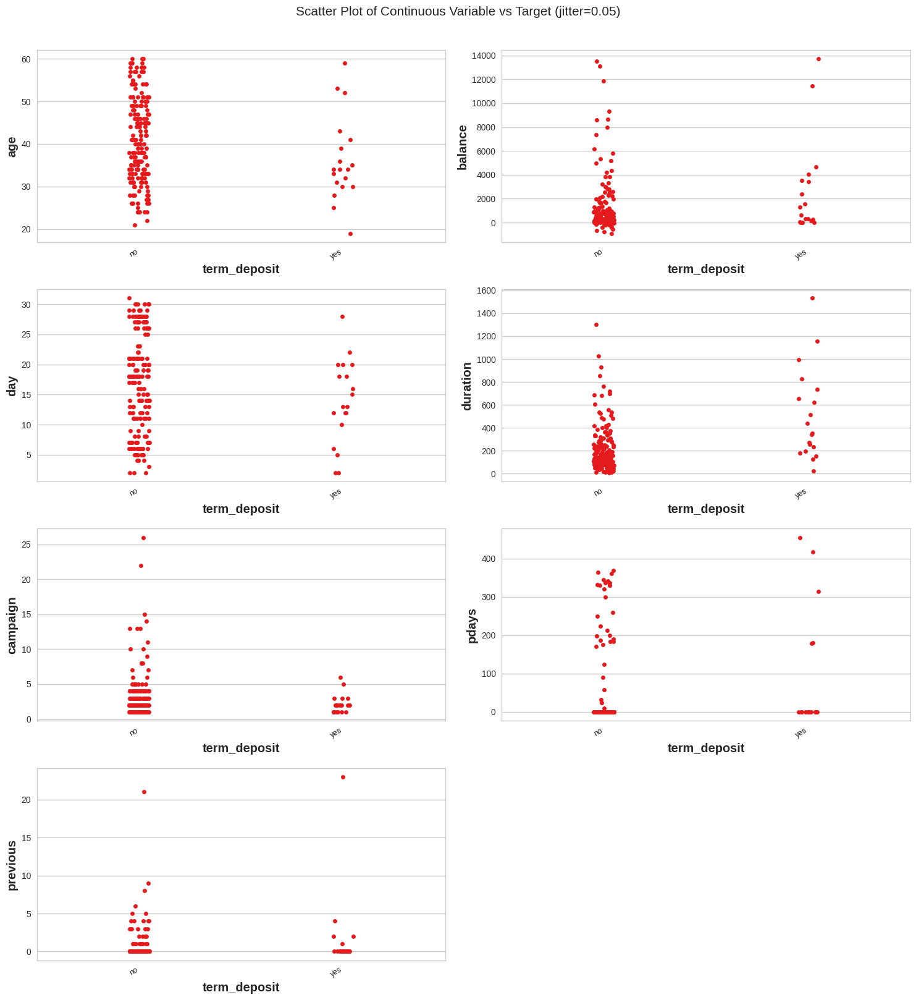

Total Number of Scatter Plots = 28


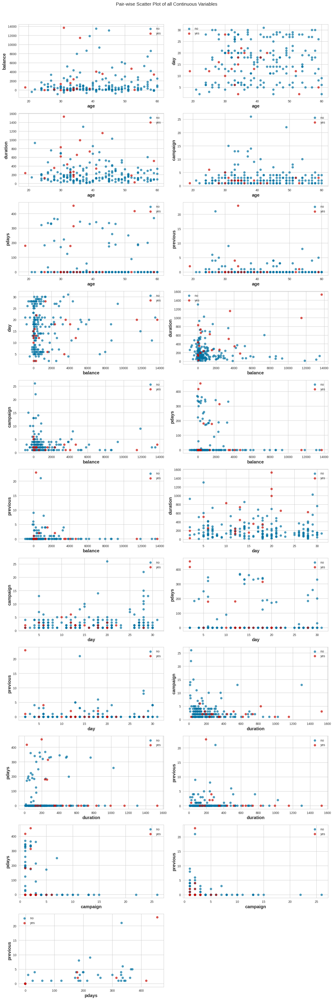

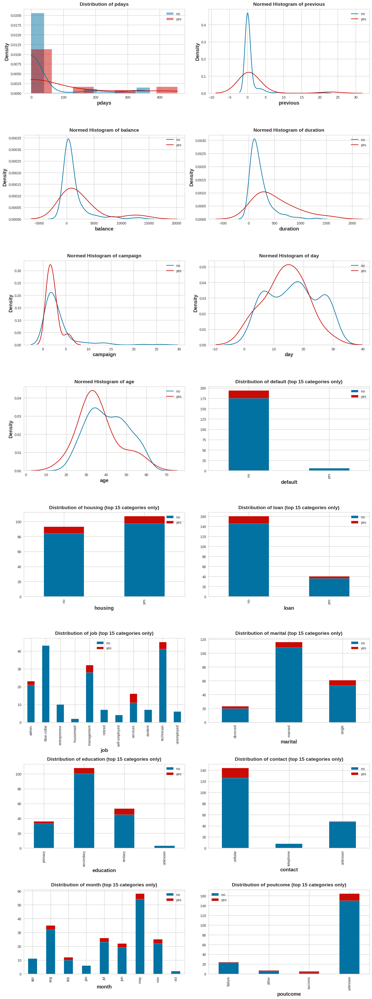

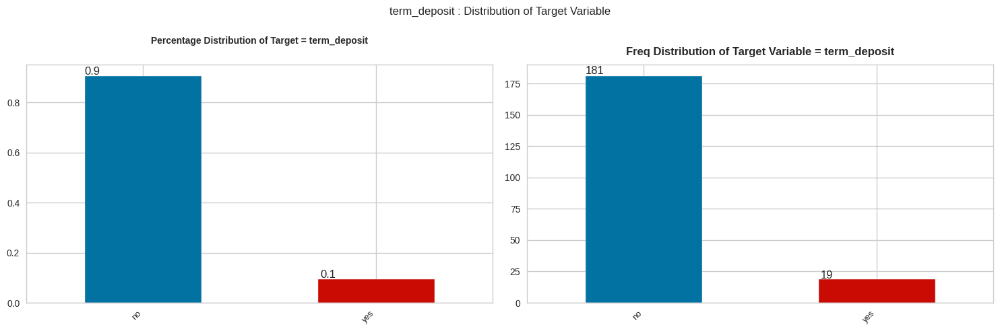

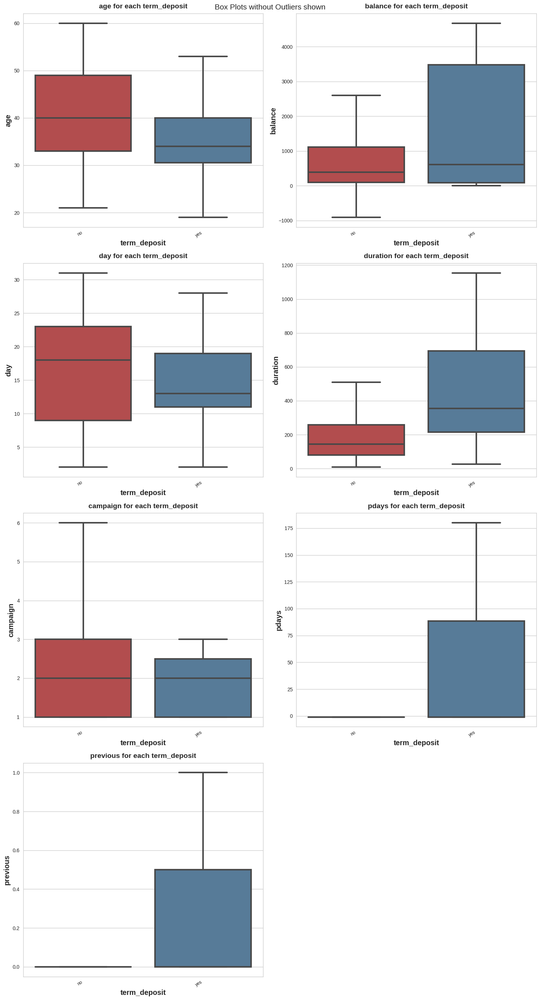

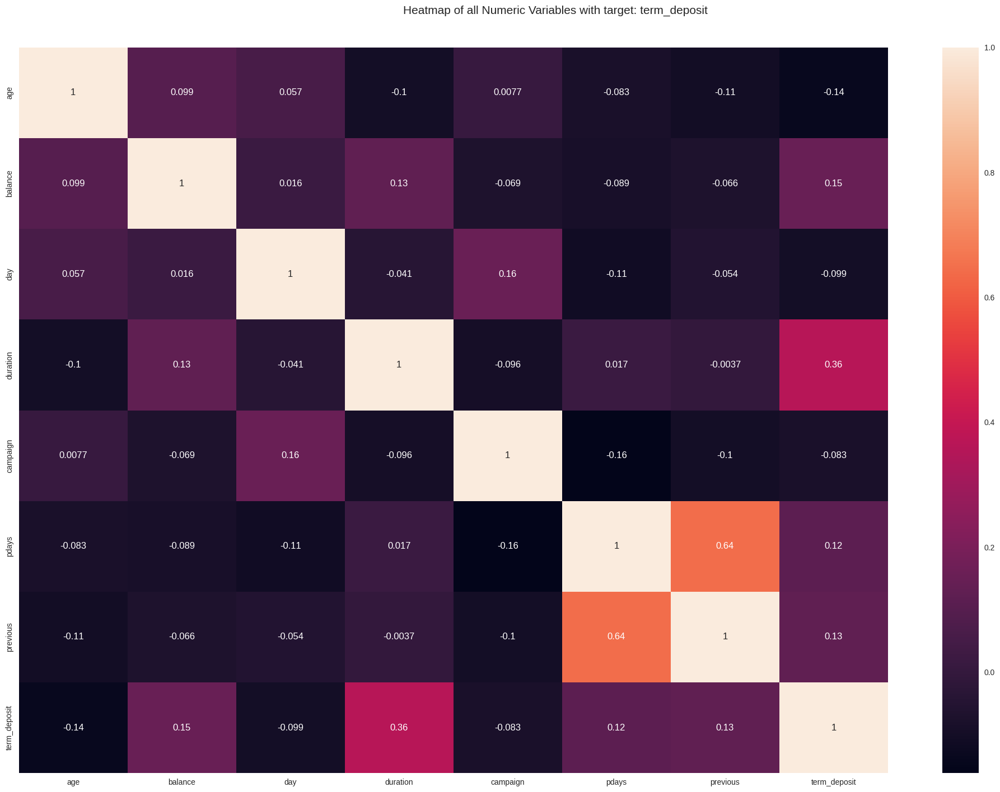

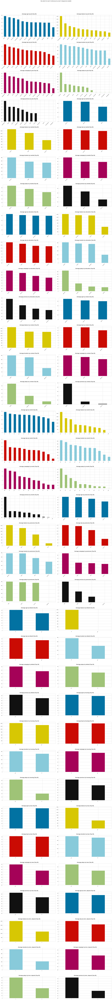

All Plots done
Time to run AutoViz = 56 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
AutoViz_Class().AutoViz(df)

AV = AutoViz_Class()
dft = AV.AutoViz(
    filename="",
    sep="",
    depVar="term_deposit",
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="png",
    max_rows_analyzed=200,
    max_cols_analyzed=30,
)

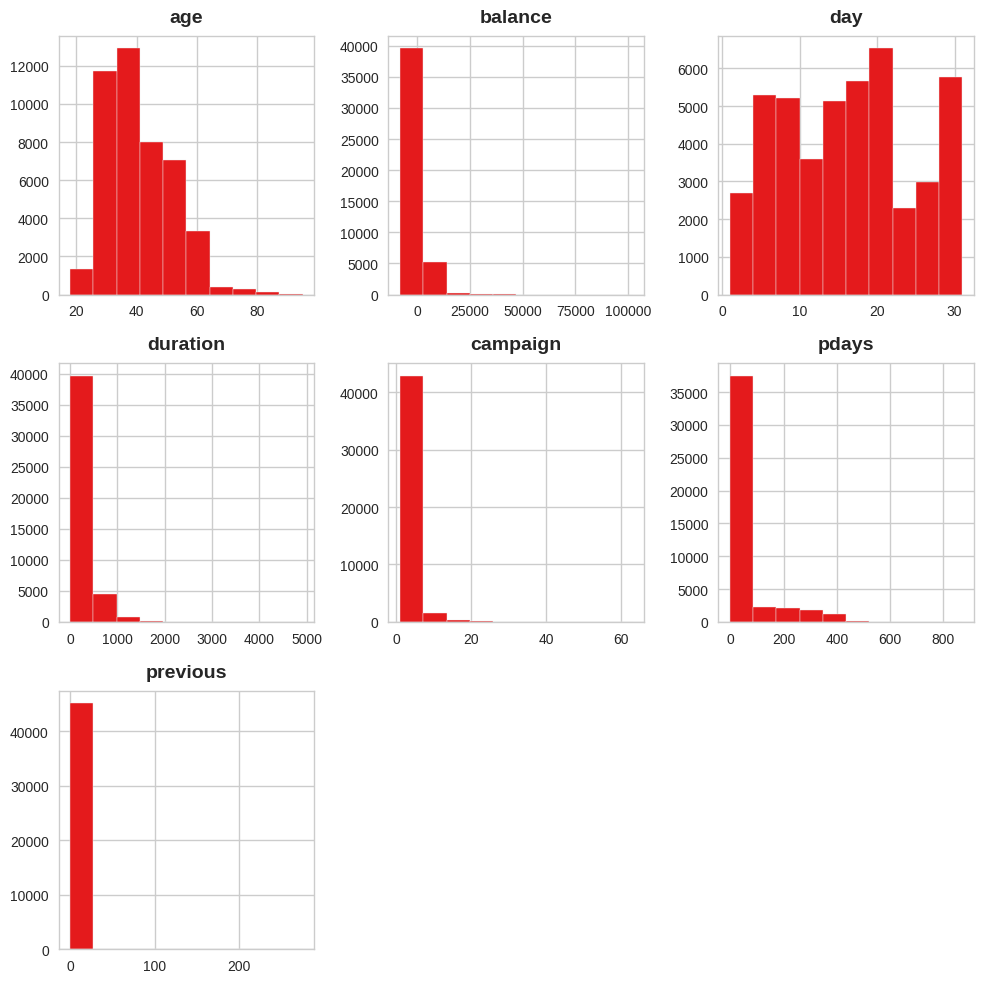

In [ ]:
# Check distributions of numerical variables
df.hist(figsize=(10, 10))  # Plot histograms for numerical variables
plt.tight_layout()
plt.show()

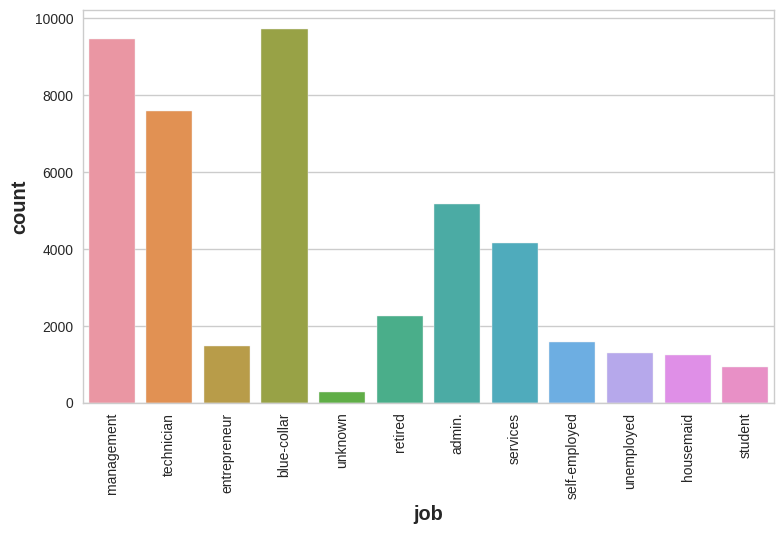

In [ ]:
# Check distributions of categorical variables
sns.countplot(x='job', data=df)  # Plot a countplot for a categorical variable (e.g., 'job')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

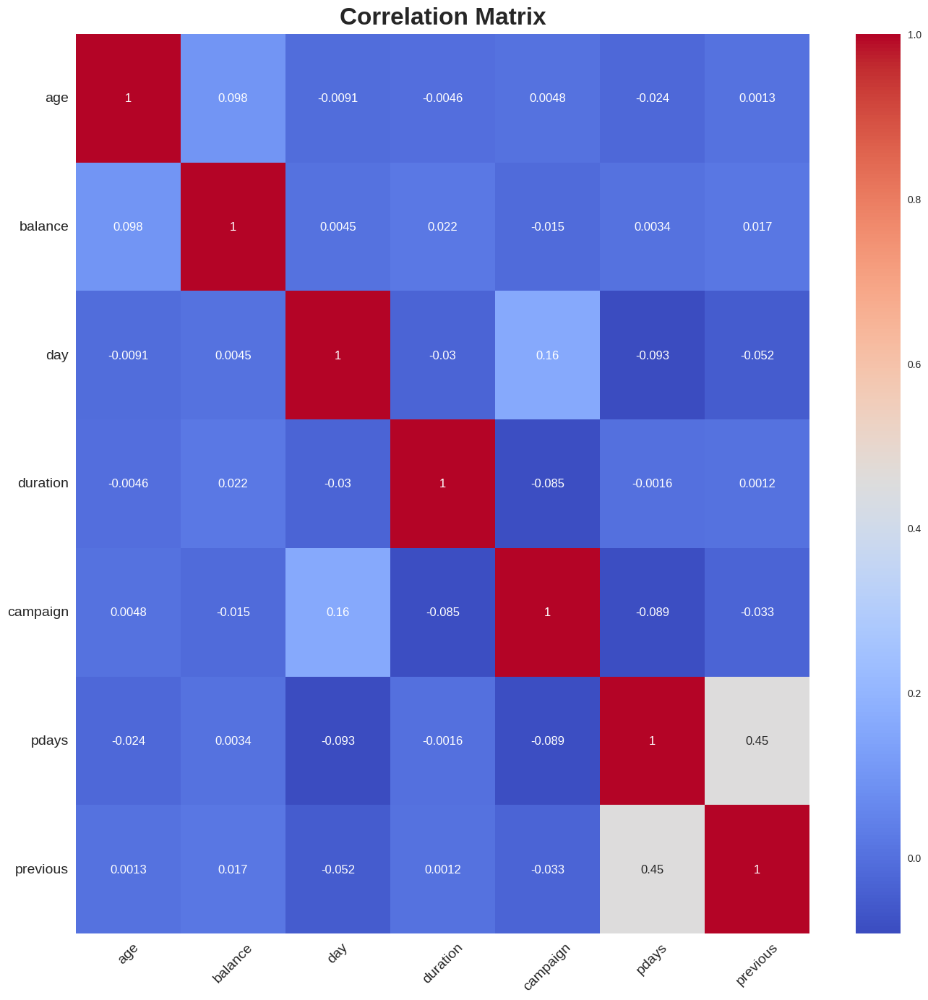

In [ ]:
# Check correlations between variables
fig, ax = plt.subplots(figsize=(14, 14))
correlation_matrix = df.corr()  # Compute the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', ax=ax, annot_kws={"size": 12})  # Plot a heatmap of the correlation matrix
plt.xticks(fontsize=14, rotation=45)
plt.yticks(fontsize=14, rotation=0)
plt.title('Correlation Matrix', fontsize=24)
plt.show()

In [ ]:
# ydata-profiling report of each variable 
# Produce and save the profiling report
profile = ProfileReport(df, title="Report")
profile.to_widgets()
profile.to_notebook_iframe()
#profile.to_file("report.html")

# Define the path to the PDF file
#pdf = 'report.pdf'  # Replace with the actual file path

# Display the PDF in a browser
#IFrame(pdf, width=800, height=600)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# DataPrep report
create_report(df)

In [ ]:
# SweetViz visualizations and summarizing important feature statistics
# Produce and save the profiling report
report = sv.analyze(df)
#report.show_html('report.html')
report.show_notebook()

In [ ]:
df['job'].unique()

In [ ]:
le = LabelEncoder()
df['job']=le.fit_transform(df['job'])
df['marital']=le.fit_transform(df['marital'])
df['education']=le.fit_transform(df['education'])
df['housing']=le.fit_transform(df['housing'])
df['loan']=le.fit_transform(df['loan'])
df['contact']=le.fit_transform(df['contact'])
df['month']=le.fit_transform(df['month'])
df['poutcome']=le.fit_transform(df['poutcome'])
df['term_deposit']=le.fit_transform(df['term_deposit'])
df['default']=le.fit_transform(df['default'])

In [ ]:
# Drop rows with missing values
#df = df.dropna()

In [ ]:
# Handling categorical variables
# Encode categorical variables using one-hot encoding
df_encoded = pd.get_dummies(df, drop_first=True)

In [ ]:
# Handling numerical variables
# Perform feature scaling on numerical variables
#scaler = StandardScaler()
#numerical_vars = ['age', 'balance']
#df_encoded[numerical_vars] = scaler.fit_transform(df_encoded[numerical_vars])

In [ ]:
# Feature Engineering 
# Perform feature engineering to create new features or transform existing ones

In [ ]:
# Transform existing features
#pt = PowerTransformer()
#df['balance_transformed'] = pt.fit_transform(df[['balance']])

In [ ]:
# Normalize numerical features
#scaler = MinMaxScaler()
#numerical_vars = ['age', 'balance']
#df[numerical_vars] = scaler.fit_transform(df[numerical_vars])

In [ ]:
# Train-Test Split
X = df.drop('term_deposit', axis=1)
y = df['term_deposit']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Model Training and Evaluation with PyCaret
# Initialize PyCaret setup
clf = setup(data=df, target='term_deposit', train_size=0.8)

In [ ]:
# Compare multiple models using lazypredict
#clf = LazyClassifier(predictions = True)
#models, predictions = clf.fit(X_train, X_test, y_train, y_test)
#models

In [ ]:
# Select the best-performing model based on desired metric
# Compare multiple models using PyCaret
best_model = compare_models(sort='Accuracy')

In [ ]:
# Once you have selected the best model, you can use it for further analysis and evaluation.
print(best_model)

In [ ]:
# Train the CatBoostClassifier model
model = CatBoostClassifier()
model.fit(X_train, y_train)

# Generate a background dataset
background_samples = X_train.sample(n=1000, random_state=42)  

# Create a SHAP explainer
explainer = shap.TreeExplainer(model, X, model_output='probability', feature_perturbation='interventional', X_background=background_samples)

# Calculate SHAP values
shap_values = explainer.shap_values(X)

# Access the SHAP values for a specific class (if applicable)
class_idx = 1  # Adjust the class index as needed
shap_values_class = shap_values[class_idx]

# Visualize the SHAP values
shap.summary_plot(shap_values, X_train)

In [ ]:
dashboard(best_model, 'external')

In [ ]:
# Generate the SHAP explainer with X_background
shap_explainer = shap.TreeExplainer(best_model, X_background=X_background, feature_perturbation='tree_path_dependent')

# Analyze the model with Sweetviz
report = sv.analyze(df)

# Show the report
report.show_notebook()

In [ ]:
# This function analyzes the performance of a trained model on the test set. It may require re-training the model in certain cases.
evaluate_model(best_model)

In [ ]:
plot_model(best_model)

In [ ]:
interpret_model(best_model)

In [ ]:
# generate 'AUC' plot
plot_model(best_model, plot = 'auc')

In [ ]:
# generate 'Confusion Matrix' plot
plot_model(best_model, plot = 'confusion_matrix')

In [ ]:
# This function scores the data and returns prediction_label and prediction_score probability of the predicted class). When data is None, it predicts label and score on the test set (created during the setup function).
predict_model(best_model)

In [ ]:
# The evaluation metrics are calculated on the test set. The second output is the pd.DataFrame with predictions on the test set (see the last two columns). 
# To generate labels on the unseen (new) dataset, simply pass the dataset in the data parameter under predict_model function.
# Score means the probability of the predicted class (NOT the positive class). If prediction_label is 0 and prediction_score is 0.90, this means 90% probability of class 0.
predictions = predict_model(best_model, data=df)
predictions.head()

In [ ]:
# Showing the probability of both the classes
predictions = predict_model(best_model, data=df, raw_score=True)
predictions.head()

In [ ]:
# Model Interpretability with SHAP
# Calculate SHAP values
#explainer = shap.Explainer(best_model)
#shap_values = explainer.shap_values(X_test)

In [ ]:
# Summary Plot
#shap.summary_plot(shap_values, X)

In [ ]:
# Individual Feature Importance
# Example: Creating a dependence plot for feature 'age'
#shap.dependence_plot('age', shap_values, X_test)

In [ ]:
# Creating a dependence plot for feature 'age'
#shap.dependence_plot('duration', shap_values, X_test)


In [ ]:
# Interaction Effects
# Creating a dependence plot for the interaction between 'age' and 'education'
#age_idx = X_test.columns.get_loc('age')
#education_idx = X_test.columns.get_loc('education')
#shap.dependence_plot(age_idx, shap_values, X_test, interaction_index=education_idx)


In [ ]:
#age_idx = X_test.columns.get_loc('age')
#education_idx = X_test.columns.get_loc('marital')
#shap.dependence_plot(age_idx, shap_values, X_test, interaction_index=education_idx)

In [ ]:
#age_idx = X_test.columns.get_loc('age')
#education_idx = X_test.columns.get_loc('housing')
#shap.dependence_plot(age_idx, shap_values, X_test, interaction_index=education_idx)

In [ ]:
#age_idx = X_test.columns.get_loc('age')
#education_idx = X_test.columns.get_loc('balance')
#shap.dependence_plot(age_idx, shap_values, X_test, interaction_index=education_idx)

In [ ]:
#age_idx = X_test.columns.get_loc('age')
#education_idx = X_test.columns.get_loc('loan')
#shap.dependence_plot(age_idx, shap_values, X_test, interaction_index=education_idx)

In [ ]:
#age_idx = X_test.columns.get_loc('age')
#education_idx = X_test.columns.get_loc('job')
#shap.dependence_plot(age_idx, shap_values, X_test, interaction_index=education_idx)

In [ ]:
#Summary Bar Plot
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [ ]:
# Count of customers in each job category
job_counts = df['job'].value_counts()
plt.figure(figsize=(8, 6))
plt.bar(job_counts.index, job_counts.values)
plt.xlabel('Job Category')
plt.ylabel('Count')
plt.title('Distribution of Customers by Job Category')
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(df['age'], bins=20)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Distribution of Customer Age')
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df['age'], df['balance'], c=df['term_deposit'], cmap='coolwarm')
plt.xlabel('Age')
plt.ylabel('Account Balance')
plt.title('Age vs. Account Balance')
plt.colorbar(label='Subscription')
plt.show()

In [ ]:
fig = go.Figure(data=[go.Bar(x=job_counts.index, y=job_counts.values)])
fig.update_layout(
    title='Distribution of Customers by Job Category',
    xaxis_title='Job Category',
    yaxis_title='Count'
)
fig.show()

In [ ]:
fig = go.Figure(data=[go.Scatter3d(
    x=df['age'],
    y=df['balance'],
    z=df['duration'],
    mode='markers',
    marker=dict(
        color=df['term_deposit'],
        colorscale='Viridis',
        opacity=0.8
    )
)])
fig.update_layout(
    scene=dict(
        xaxis_title='Age',
        yaxis_title='Account Balance',
        zaxis_title='Duration'
    ),
    title='Customer Segmentation in 3D'
)
fig.show()

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Display feature importance
feature_importance = best_model.feature_importances_
feature_names = X_train.columns

plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance, y=feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance')
plt.show()

In [ ]:
# Display performance metrics
y_pred = best_model.predict(X_test)

print(classification_report(y_test, y_pred))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Create interactive visualizations with Plotly
fig = px.scatter(df, x='age', y='balance', color='term_deposit')
fig.update_layout(title='Age vs. Balance', xaxis_title='Age', yaxis_title='Balance')
fig.show()

In [ ]:
# Tune hyperparameters of the best model using grid search
tuned_model = tune_model(best_model)

In [ ]:
# Train the best model on the full dataset
final_model = finalize_model(best_model)

In [ ]:
# Save the model
save_model(best_model, 'term_deposit_pipeline')

In [ ]:
# Define function for making predictions
def predict_bank_marketing_model(age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, pdays, previous, poutcome):
    input_df = pd.DataFrame({
        'age': [age],
        'job': [job],
        'marital': [marital],
        'education': [education],
        'default': [default],
        'housing': [housing],
        'loan': [loan],
        'contact': [contact],
        'month': [month],
        'day_of_week': [day_of_week],
        'duration': [duration],
        'campaign': [campaign],
        'pdays': [pdays],
        'previous': [previous],
        'poutcome': [poutcome]
    })
    model = load_model('term_deposit_pipeline')
    prediction = predict_model(model, data=input_df)
    return prediction['Term Deposit'][0]

# Define function for making predictions
def predict_bank_marketing_model(age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, pdays, previous, poutcome):
    input_df = pd.DataFrame({
        'age': [age],
        'job': [job],
        'marital': [marital],
        'education': [education],
        'default': [default],
        'housing': [housing],
        'loan': [loan],
        'contact': [contact],
        'month': [month],
        'day_of_week': [day_of_week],
        'duration': [duration],
        'campaign': [campaign],
        'pdays': [pdays],
        'previous': [previous],
        'poutcome': [poutcome]
    })
    model = load_model('bank_marketing_model')
    prediction = predict_model(model, data=input_df)
    return prediction['Label'][0]

# Define input and output interfaces
inputs = [
    gr.inputs.Slider(minimum=18, maximum=95, label='Age'),
    gr.inputs.Radio(['admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management', 'retired', 'self-employed', 'services', 'student', 'technician', 'unemployed', 'unknown'], label='Job'),
    gr.inputs.Radio(['divorced', 'married', 'single', 'unknown'], label='Marital Status'),
    gr.inputs.Radio(['basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree', 'unknown'], label='Education Level'),
    gr.inputs.Radio(['no', 'yes'], label='Has Credit in Default?'),
    gr.inputs.Radio(['no', 'yes'], label='Has Housing Loan?'),
    gr.inputs.Radio(['no', 'yes'], label='Has Personal Loan?'),
    gr.inputs.Radio(['cellular', 'telephone'], label='Contact Communication Type'),
    gr.inputs.Radio(['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'], label='Last Contact Month of Year'),
    gr.inputs.Radio(['mon','tue','wed','thu','fri'], label='Last Contact Day of the Week (Monday to Friday)'),
    gr.inputs.Number(label='Last Contact Duration (Seconds)'),
    gr.inputs.Number(label='Number of Contacts Performed During This Campaign and For This Client (Including Last Contact)'),
    gr.inputs.Number(label='Number of Days That Passed by After the Client Was Last Contacted from a Previous Campaign (999 Means Client Was Not Previously Contacted)'),
    gr.inputs.Number(label='Number of Contacts Performed Before This Campaign and For This Client (Numeric; Includes Last Contact)'),
    gr.inputs.Radio(['failure','nonexistent','success'], label='Outcome of the Previous Marketing Campaign (Categorical: "failure","nonexistent","success")')
]
output = gr.outputs.Label(label="Prediction")

# Launch interface
gr.Interface(fn=predict_bank_marketing_model, inputs=inputs, outputs=output).launch(debug=True)

In [ ]:
# Deploy web application(streamlit) using google colab and ngrok
%%writefile app.py
import streamlit as st

In [ ]:
# Define Streamlit app
st.title('Bank Term Deposit Marketing Prediction App')
age = st.number_input('Age', min_value=18, max_value=100)
job = st.selectbox('Job', ['admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management', 'retired', 'self-employed', 'services', 'student', 'technician', 'unemployed', 'unknown'])
marital = st.selectbox('Marital Status', ['divorced', 'married', 'single', 'unknown'])
education = st.selectbox('Education Level', ['basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree', 'unknown'])
default = st.selectbox('Has Credit in Default?', ['no', 'yes'])
housing = st.selectbox('Has Housing Loan?', ['no', 'yes'])
loan = st.selectbox('Has Personal Loan?', ['no', 'yes'])
contact = st.selectbox('Contact Communication Type', ['cellular', 'telephone'])
month = st.selectbox('Last Contact Month of Year', ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'])
day_of_week = st.selectbox('Last Contact Day of the Week (Monday to Friday)', ['mon','tue','wed','thu','fri'])
duration = st.number_input('Last Contact Duration (Seconds)', min_value=0)
campaign = st.number_input('Number of Contacts Performed During This Campaign and For This Client (Including Last Contact)', min_value=0)
pdays = st.number_input('Number of Days That Passed by After the Client Was Last Contacted from a Previous Campaign (999 Means Client Was Not Previously Contacted)', min_value=0)
previous = st.number_input('Number of Contacts Performed Before This Campaign and For This Client (Numeric; Includes Last Contact)', min_value=0)
poutcome = st.selectbox('Outcome of the Previous Marketing Campaign (Categorical: "failure","nonexistent","success")',['failure','nonexistent','success'])

if st.button('Predict'):
    prediction = predict_bank_marketing_model(age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, pdays, previous, poutcome)
    if prediction == 1:
        st.write('The client is likely to subscribe a term deposit.')
    else:
        st.write('The client is unlikely to subscribe a term deposit.')